In [330]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [331]:
def load_img(fname):  
    img=cv2.cvtColor((cv2.imread('DATA/'+fname).astype(np.float32)/255),cv2.COLOR_BGR2RGB)
    return img

def display_img(img):
    fig=plt.figure(figsize=(18,16))
    ax=fig.add_subplot(111)
    ax.imshow(img)


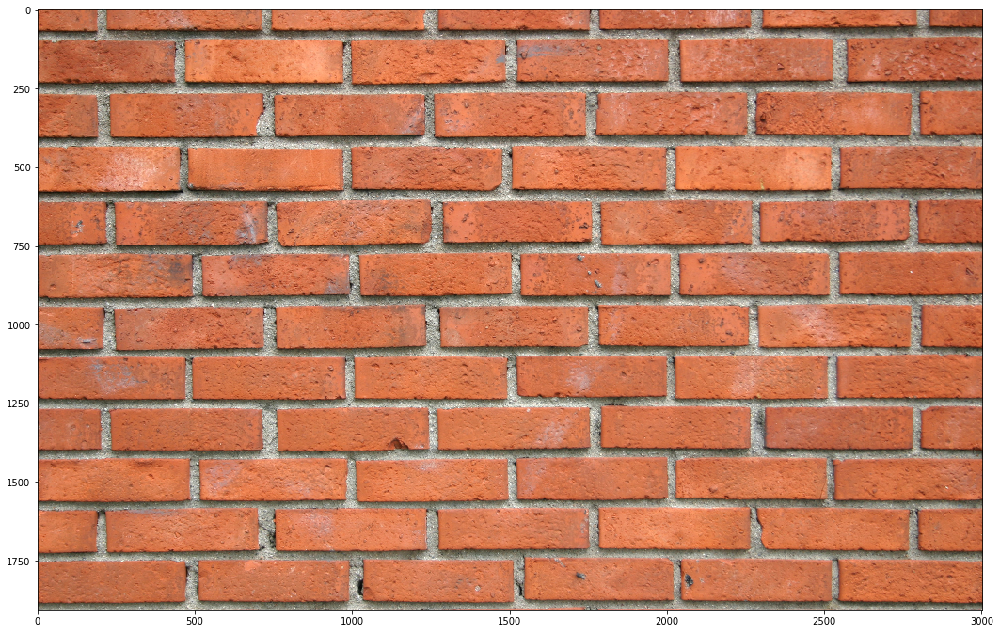

In [332]:
img=load_img('PT06.jpg')
display_img(img)

In [333]:
gamma = 1.25

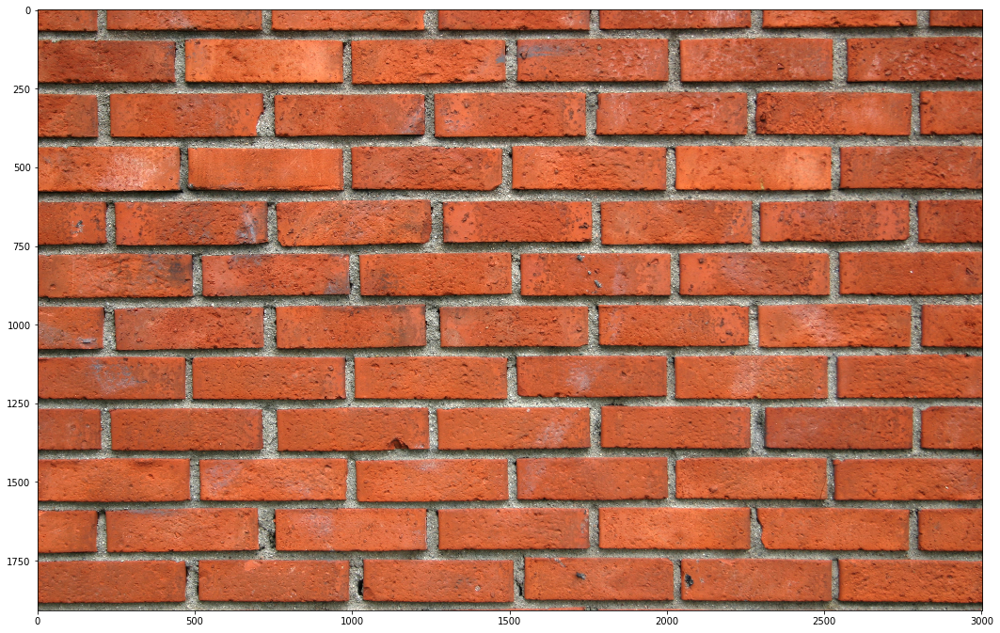

In [334]:
img=np.power(img,gamma)
display_img(img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1908


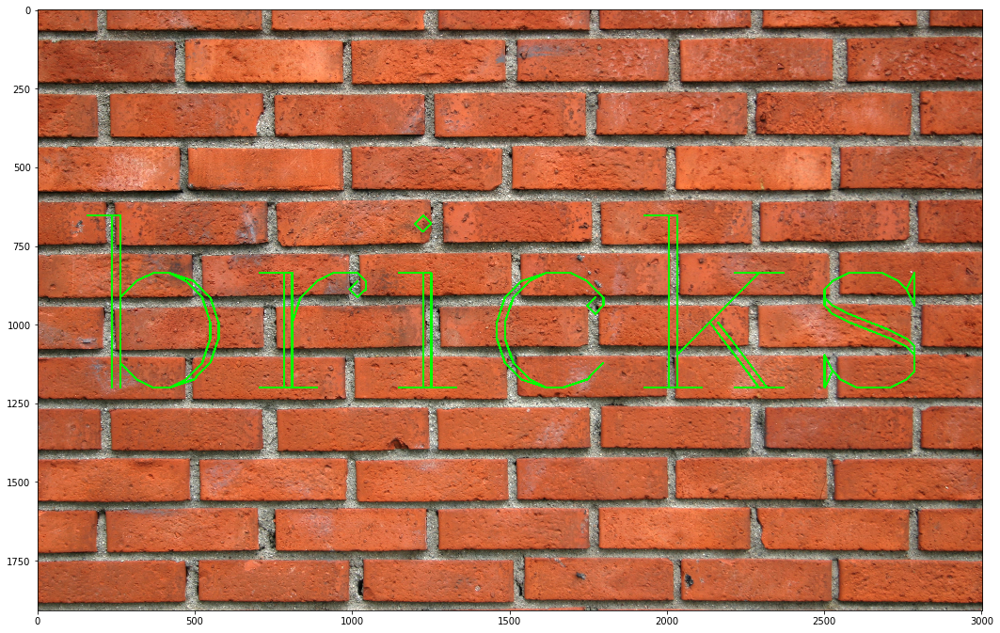

In [335]:
font=cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img,text='bricks',org=(int(img.shape[0]/18),int(img.shape[1]/2.5)),fontFace=font,fontScale=26,color=(0,255,0),thickness=6)
display_img(img)
print(img.shape[0])

In [336]:
kernal = np.ones(shape=(5,5),dtype=np.float32)/25

In [337]:
kernal

array([[0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04]], dtype=float32)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


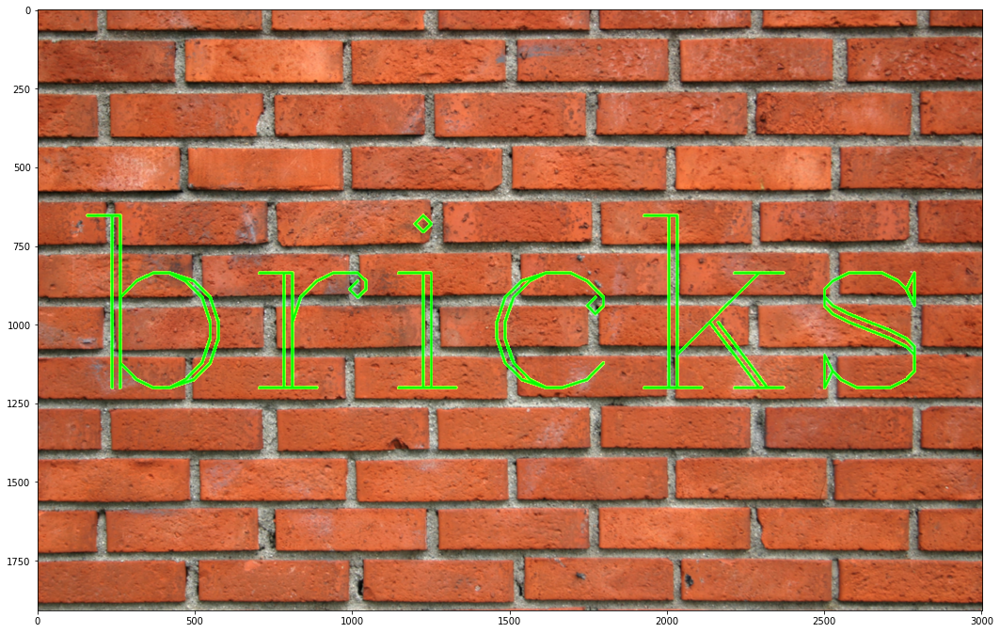

In [338]:
dst=cv2.filter2D(img,-1,kernal)
display_img(dst)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


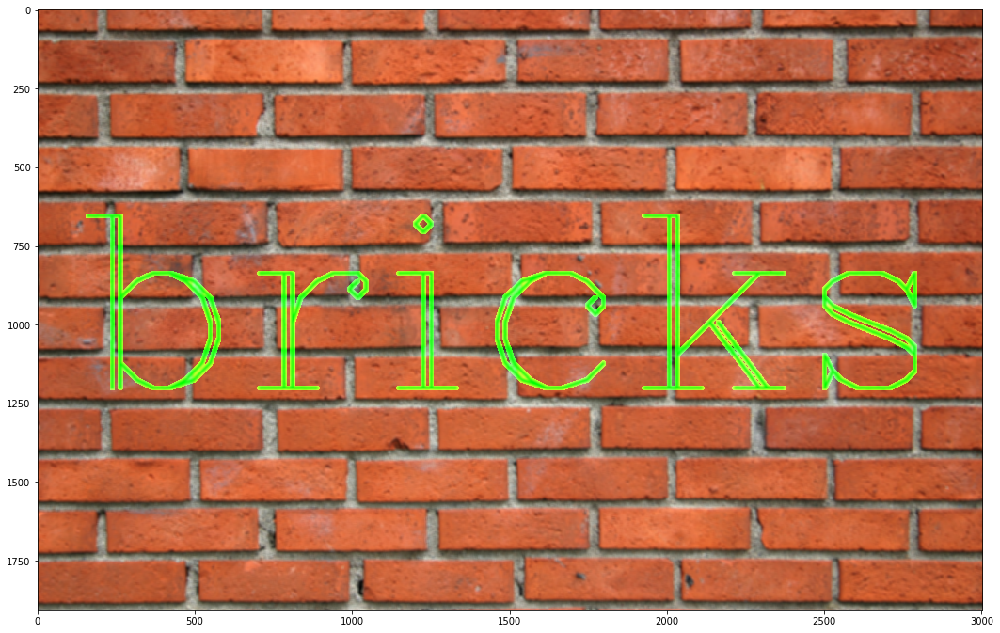

In [339]:
blurred = cv2.blur(img,ksize=(10,10))
#cv2.GaussianBlur(img,(5,5),10)
#median_result = cv2.medianBlur(img,5)
display_img(blurred)

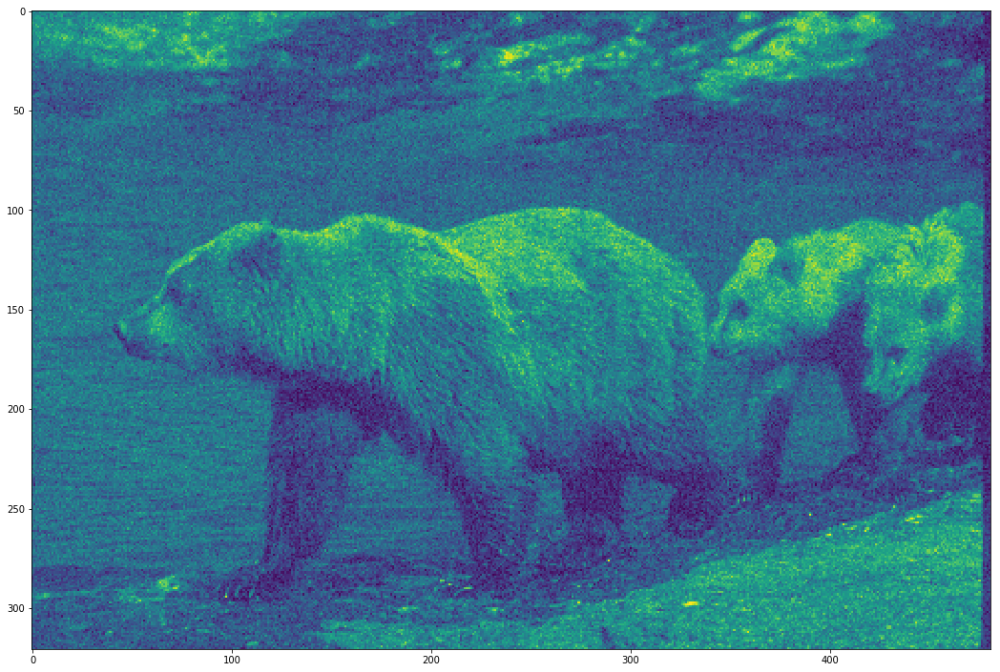

In [340]:
img=cv2.imread('DATA/PT07.jpg',0)
display_img(img)

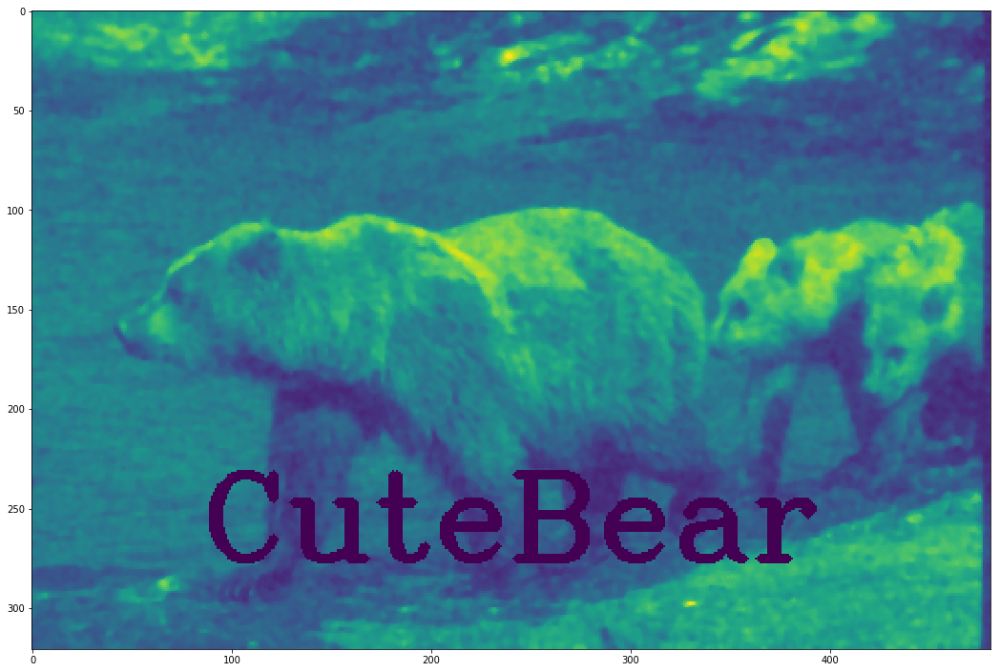

In [341]:
bilateral = cv2.bilateralFilter(img,5,75,75)
result=cv2.medianBlur(bilateral,3)
cv2.putText(result,text='CuteBear',org=(85,275),fontFace=font,fontScale=2,color=(0,255,0),thickness=3)
display_img(result)


In [342]:
kernal = np.ones((5,5),dtype=np.uint8)/4
kernal

array([[0.25, 0.25, 0.25, 0.25, 0.25],
       [0.25, 0.25, 0.25, 0.25, 0.25],
       [0.25, 0.25, 0.25, 0.25, 0.25],
       [0.25, 0.25, 0.25, 0.25, 0.25],
       [0.25, 0.25, 0.25, 0.25, 0.25]])

In [343]:
img = cv2.erode(result,kernal,iterations=1)

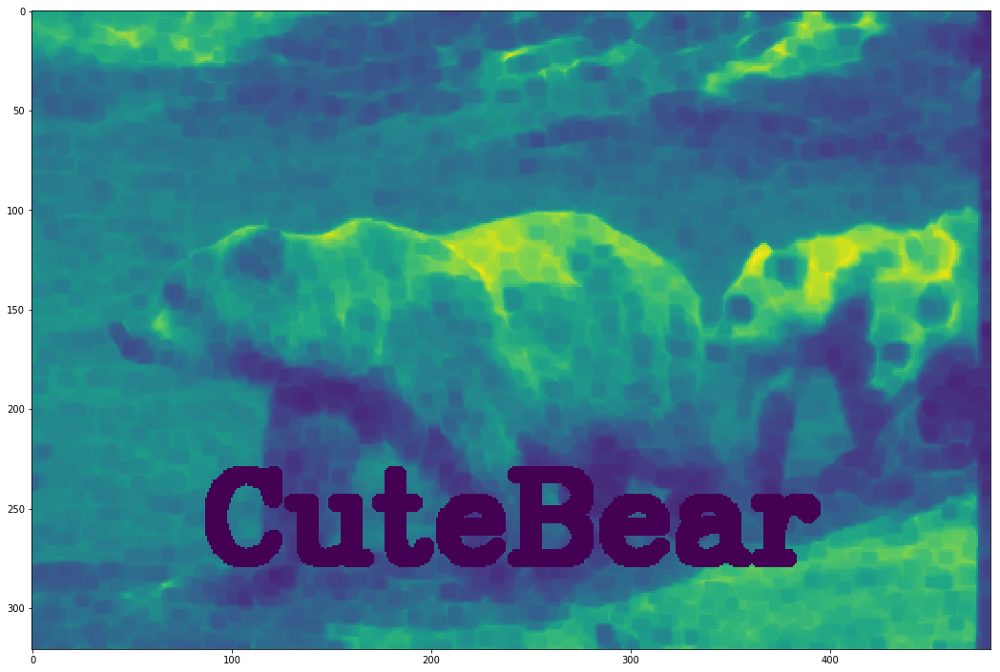

In [344]:
display_img(img)

In [345]:
white_noise = np.random.randint(low=0,high=2,size=(img.shape[0],img.shape[1]))
white_noise

array([[1, 1, 0, ..., 0, 1, 0],
       [1, 1, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 1, 0, 1],
       ...,
       [1, 0, 1, ..., 1, 1, 1],
       [0, 0, 0, ..., 1, 0, 1],
       [1, 0, 1, ..., 0, 0, 1]])

In [346]:
#display_img(white_noise)
white_noise = white_noise * -255
white_noise

array([[-255, -255,    0, ...,    0, -255,    0],
       [-255, -255,    0, ...,    0,    0,    0],
       [   0,    0,    0, ..., -255,    0, -255],
       ...,
       [-255,    0, -255, ..., -255, -255, -255],
       [   0,    0,    0, ..., -255,    0, -255],
       [-255,    0, -255, ...,    0,    0, -255]])

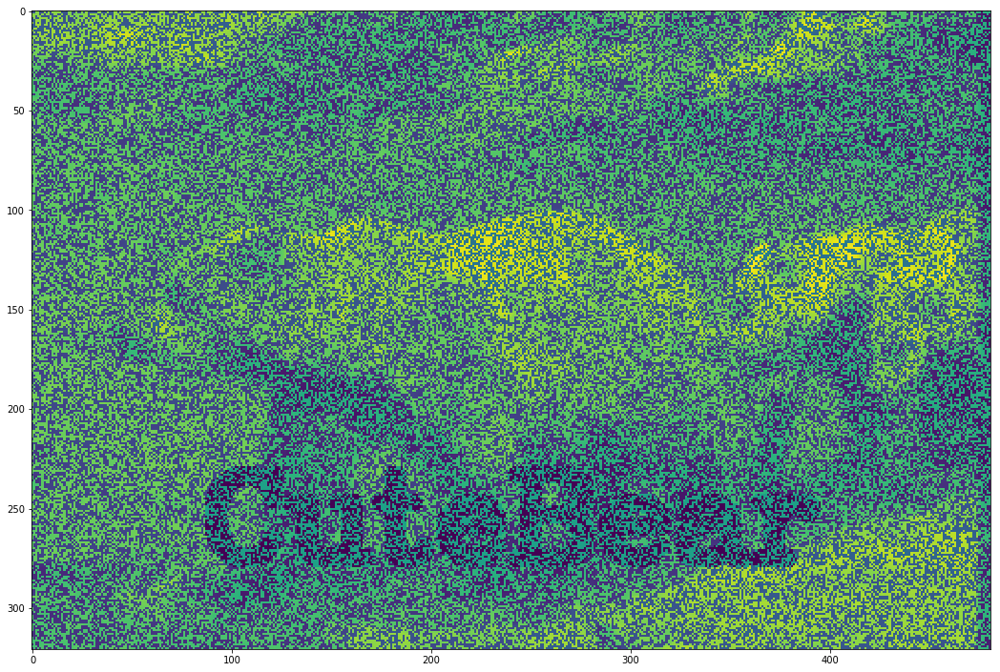

In [347]:
noising_img=white_noise + img
display_img(noising_img)

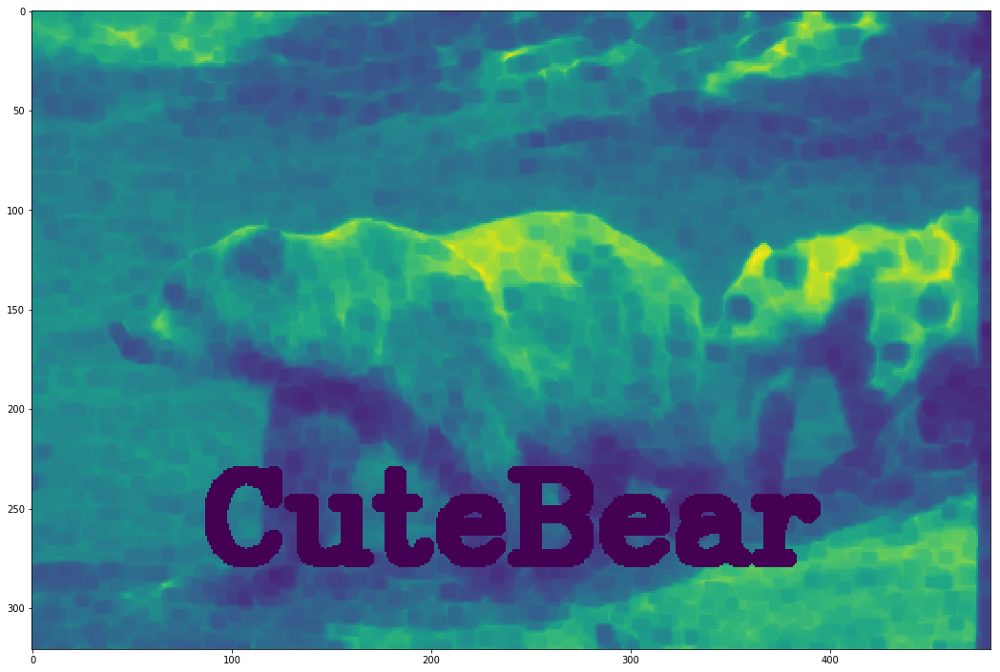

In [352]:
closing = cv2.morphologyEx(img,cv2.MORPH_CLOSE,kernal)
display_img(closing)